this notebook is an addition to the original _1/2/3


fonctions and parameters are the same as in previous notebook and are not reported again

# FC dynamic across the 6 weeks 

In [ ]:
#calculate the average top 1% values of different anatomical region across the experimental paradigm



caststampsinit=[[],[],[]]
caststampsend=[[],[],[]]
for e,s in enumerate(sub):
    caststampssic01=np.array(datelist[e])[np.where(np.array(datelist[e]).T[1]==pplist[e][2][0][2:pplist[e][2][0].find('_')])[0]][0][2]
    caststampsinit[e]=caststampssic01
    caststampssic01=np.array(datelist[e])[np.where(np.array(datelist[e]).T[1]==pplist[e][2][len(pplist[e][2])-1][2:pplist[e][2][len(pplist[e][2])-1].find('_')])[0]][0][2]
    caststampsend[e]=caststampssic01

structurename=['CIFTI_STRUCTURE_THALAMUS_LEFT','CIFTI_STRUCTURE_PUTAMEN_LEFT','CIFTI_STRUCTURE_CEREBELLUM_RIGHT','SM1 RIGHT']

val=[[[] for i in range(len(structurename)+1)] for j in range(len(sub))]
time=[[] for j in range(len(sub))]
d0 = date(2014, 1, 1)
comp='cast-pre'
for e,s in enumerate(sub):
    
    side='L'
    

    listfile=glob.glob('path/'+s+'/vc*/boldrest_1/LeftSM1corrmat.dtseries.nii')
    


    basefile='path/'+s+'/pulsemodel'
    if e==0:

        pathorig=basefile+'_'+side+'sm1_peakseries_during_avg_smooth6.0_masked80N_cut1.1-2-_Lsm1FCcastpre-1-_overlap-3_ALL.dtseries.nii'
    else:
        pathorig=basefile+'_'+side+'sm1_peakseries_during_avg_smooth6.0_masked80N_cut1.1_333-2-_Lsm1FCcastpre-1-_overlap-3_ALL.dtseries.nii'

    pathtest='path/'+s+'/FC/'
    pathorig2=pathtest+comp+'_'+side+'sm1avg_dconn_cohensd.dtseries.nii'
    raw=nibabel.load(pathorig)
    axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
    # You'll want the brain model axis
    time_axis, brain_model_axis = axes

    mask=raw.get_fdata()[0]
    mask2=nibabel.load(pathorig2.replace('.dtseries.nii','_masked2cluster.dtseries.nii')).get_fdata()[0]
    saveloc=np.zeros(mask2.shape)
    caststampsinit[e] = date(np.int(caststampsinit[e][:4]), np.int(caststampsinit[e][4:6]), np.int(caststampsinit[e][6:]))
    caststampsend[e] = date(np.int(caststampsend[e][:4]), np.int(caststampsend[e][4:6]), np.int(caststampsend[e][6:]))
    
    caststampsend[e]=(caststampsend[e]-d0).days
    caststampsinit[e]=(caststampsinit[e]-d0).days
    for l2,l in enumerate(listfile):
        day=np.array(datelist[e])[np.where(np.array(datelist[e]).T[1]==l.replace('path/'+s+'/vc','').replace('/boldrest_1/LeftSM1corrmat.dtseries.nii',''))[0]][0][2]
        d1 = date(np.int(day[:4]), np.int(day[4:6]), np.int(day[6:]))
        delta = d1 - d0
        time[e]+=[delta.days]
        
        
        for n2,n in enumerate(structurename):
            if n2==3:
                handroi='path/'+s+'/handseed.dtseries.nii'
                pro=nibabel.load(handroi).get_fdata()[0]
                loc=np.where(pro==-1)[0]
                
            else:####### get the top 1% cerebellum as mask then add to loc selection ## maybe do forthalamus putamen too , for coherence, so select within structure
                if e==0:
                    file='path/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope3/tstat3_smooth6.0.dtseries.nii'
            
                else:
        
                    file='path/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope3/tstat3_smooth6.0_333.dtseries.nii'
                mask3=nibabel.load(file).get_fdata()[0]
                thresh3=np.percentile(mask[np.where(brain_model_axis.name==n)[0]],99)
                loc=np.where((mask2>0)&(brain_model_axis.name==n)&(mask3>=thresh3))[0]
            
            if l2==1:
                saveloc[loc]=1
                
            valloc=mask2[loc]
            val[e][n2]+=[np.nansum([i*valloc[i2] for i2,i in enumerate(nibabel.load(l).get_fdata()[0][loc])])/np.nansum(valloc)]
    

In [ ]:
#same for additional anatomical regios (relevant for post-cast effect)


caststampsinit=[[],[],[]]
caststampsend=[[],[],[]]
for e,s in enumerate(sub):
    caststampssic01=np.array(datelist[e])[np.where(np.array(datelist[e]).T[1]==pplist[e][2][0][2:pplist[e][2][0].find('_')])[0]][0][2]
    caststampsinit[e]=caststampssic01
    caststampssic01=np.array(datelist[e])[np.where(np.array(datelist[e]).T[1]==pplist[e][2][len(pplist[e][2])-1][2:pplist[e][2][len(pplist[e][2])-1].find('_')])[0]][0][2]
    caststampsend[e]=caststampssic01

structurenamepost=['CIFTI_STRUCTURE_CAUDATE_LEFT','CIFTI_STRUCTURE_CAUDATE_RIGHT']

valpost=[[[] for i in range(len(structurenamepost)+1)] for j in range(len(sub))]
time=[[] for j in range(len(sub))]
d0 = date(2014, 1, 1)
comp='post-cast'
for e,s in enumerate(sub):
    
    side='L'
    
    listfile=glob.glob('path/'+s+'/vc*/boldrest_1/LeftSM1corrmat.dtseries.nii')
    


    basefile='path/'+s+'/pulsemodel'
    if e==0:

        pathorig=basefile+'_'+side+'sm1_peakseries_during_avg_smooth6.0_masked80N_cut1.1-2-_Lsm1FCcastpre-1-_overlap-3_ALL.dtseries.nii'
    else:
        pathorig=basefile+'_'+side+'sm1_peakseries_during_avg_smooth6.0_masked80N_cut1.1_333-2-_Lsm1FCcastpre-1-_overlap-3_ALL.dtseries.nii'

    pathtest='path/RestProcessing/cast/smooth255/'+s+'/FC/'
    pathorig2=pathtest+comp+'_'+side+'sm1avg_dconn_cohensd.dtseries.nii'
    raw=nibabel.load(pathorig)
    axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
    # You'll want the brain model axis
    time_axis, brain_model_axis = axes

    mask=raw.get_fdata()[0]
    mask2=nibabel.load(pathorig2.replace('.dtseries.nii','_masked2cluster.dtseries.nii')).get_fdata()[0]
    saveloc=np.zeros(mask2.shape)
    caststampsinit[e] = date(np.int(caststampsinit[e][:4]), np.int(caststampsinit[e][4:6]), np.int(caststampsinit[e][6:]))
    caststampsend[e] = date(np.int(caststampsend[e][:4]), np.int(caststampsend[e][4:6]), np.int(caststampsend[e][6:]))
    
    caststampsend[e]=(caststampsend[e]-d0).days
    caststampsinit[e]=(caststampsinit[e]-d0).days
    for l2,l in enumerate(listfile):
        day=np.array(datelist[e])[np.where(np.array(datelist[e]).T[1]==l.replace('path/'+s+'/vc','').replace('/boldrest_1/LeftSM1corrmat.dtseries.nii',''))[0]][0][2]
        d1 = date(np.int(day[:4]), np.int(day[4:6]), np.int(day[6:]))
        delta = d1 - d0
        time[e]+=[delta.days]
        
        
        for n2,n in enumerate(structurenamepost):
            if n=='SM1 RIGHT':
                handroi='path/'+s+'/handseed.dtseries.nii'
                pro=nibabel.load(handroi).get_fdata()[0]
                loc=np.where(pro==-1)[0]
                
            else:####### get the top 1% cerebellum as mask then add to loc selection ## maybe do forthalamus putamen too , for coherence, so select within structure
                if e==0:
                    file='path/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope3/tstat3_smooth6.0.dtseries.nii'
            
                else:
        
                    file='path/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope3/tstat3_smooth6.0_333.dtseries.nii'
                mask3=nibabel.load(file).get_fdata()[0]
                thresh3=np.percentile(mask[np.where(brain_model_axis.name==n)[0]],99)
                loc=np.where((mask2>0)&(brain_model_axis.name==n))[0]#&(mask3>=thresh3))[0]
            
            if l2==1:
                saveloc[loc]=1
            
            valloc=mask2[loc]
            valpost[e][n2]+=[np.nansum([i*valloc[i2] for i2,i in enumerate(nibabel.load(l).get_fdata()[0][loc])])/np.nansum(valloc)]
    

In [710]:
#fit the 2 alpha exponential model (as done in Newbold 2020)
def fit_plasticity_model_2alpha(data, cast_onset, cast_offset, rc, alpha1, alpha2):
    cast_onset=int(cast_onset)
    cast_offset=int(cast_offset)
    r0=np.mean(data[:cast_onset])
    alpha=np.zeros(len(data))
    alpha[cast_onset:cast_offset]=alpha1
    alpha[cast_offset+1:]=alpha2

    # initialize FC
    r=np.zeros(len(data))
    dr=np.zeros(len(data))
    r[0]=r0

    B=np.zeros(len(data))
    B[:cast_onset]=r0
    B[cast_onset:cast_offset]=rc
    B[cast_offset:]=r0

    # run model
    
    for t in range(len(data)-1):
        dr[t]=alpha[t]*(B[t]-r[t])
        r[t+1]=r[t]+dr[t]
        
    
    return data-r
def plasticity_model_2alpha(data, cast_onset, cast_offset, rc, alpha1, alpha2):
    cast_onset=int(cast_onset)
    cast_offset=int(cast_offset)
    r0=np.mean(data[:cast_onset])
    alpha=np.zeros(len(data))
    alpha[cast_onset:cast_offset]=alpha1
    alpha[cast_offset:]=alpha2

    # initialize FC
    r=np.zeros(len(data))
    dr=np.zeros(len(data))
    r[0]=r0

    B=np.zeros(len(data))
    B[:cast_onset]=r0
    B[cast_onset:cast_offset]=rc
    B[cast_offset+1:]=r0

    # run model
    
    for t in range(len(data)-1):
        dr[t]=alpha[t]*(B[t]-r[t])
        r[t+1]=r[t]+dr[t]
        
    
    return r

[ 8.05000000e+00  2.20500000e+01 -3.33137732e-03  4.06463164e-01
  3.10739476e-02]


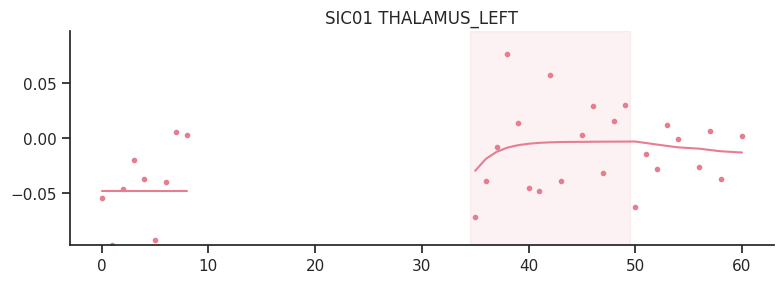

[8.05000000e+00 2.20500000e+01 6.92569409e-03 8.99911094e-01
 1.26911074e-02]


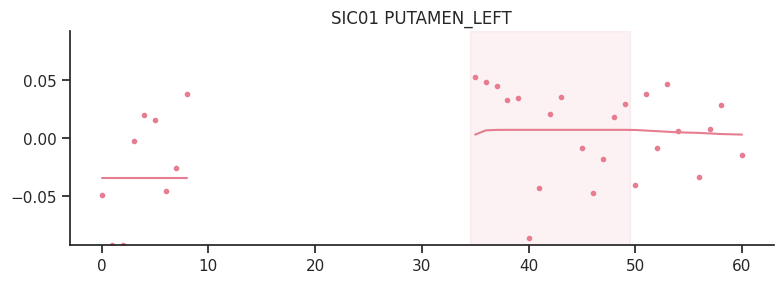

[ 8.05       22.05        0.05696169  0.61319046  0.09197321]


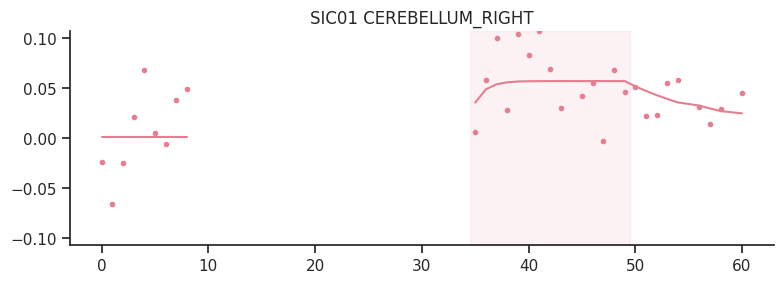

[ 8.05000000e+00  2.20500000e+01 -9.99999971e-01  7.03844026e-03
  9.42775607e-02]


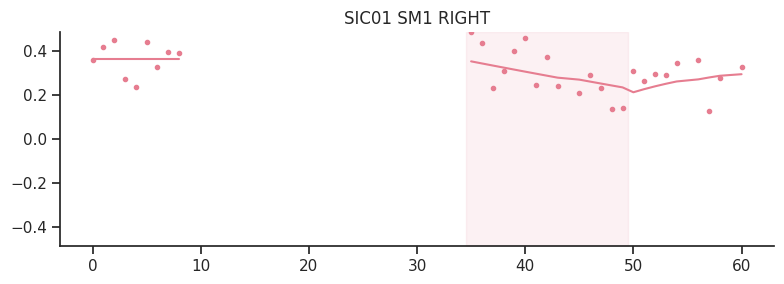

[12.05       24.05        0.09075964  0.8999983   0.8       ]


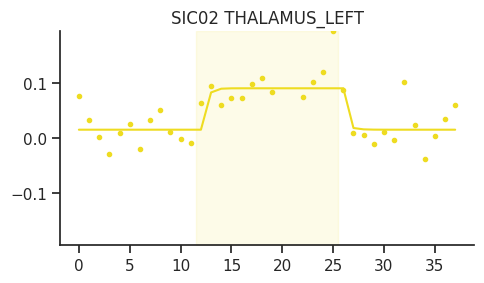

[12.05       24.05        0.16627779  0.26854727  0.8       ]


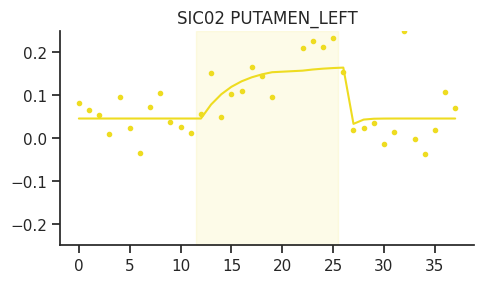

[12.05       24.05        0.19815165  0.38014557  0.8       ]


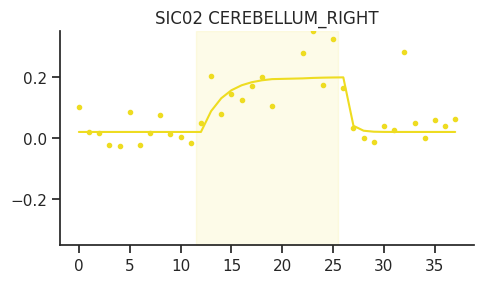

[ 1.20500000e+01  2.40500000e+01 -7.41993098e-03  7.72978042e-01
  7.97834104e-01]


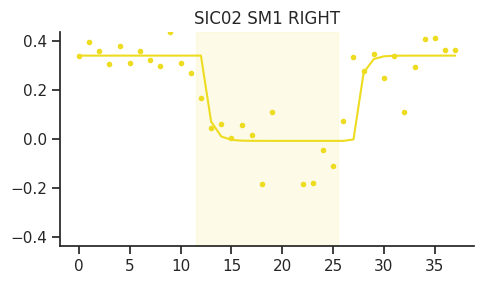

[14.05       27.05        0.14278851  0.89999997  0.08192397]


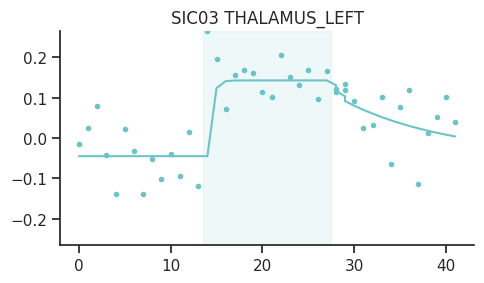

[14.05       27.05        0.11555735  0.43097078  0.05699053]


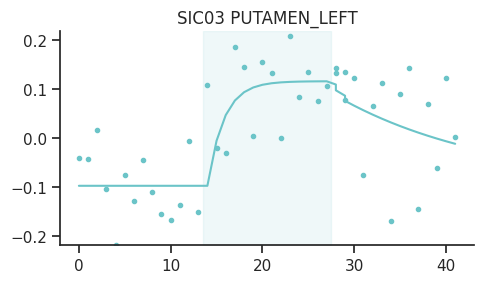

[14.05       27.05        0.22362521  0.9         0.31554337]


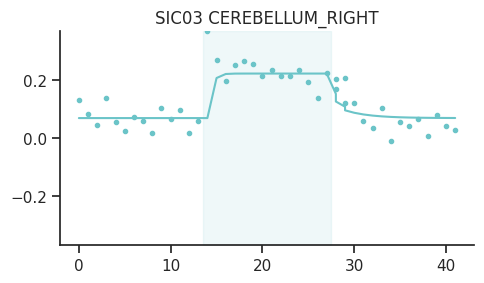

[14.05       27.05        0.11244042  0.33855941  0.05030251]


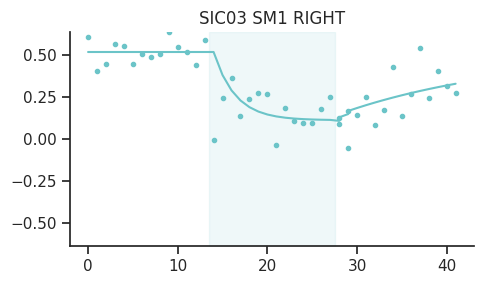

In [731]:

subpal={'SIC01':(230/255.,125/255.,144/255.),'SIC02':(238/255.,220/255.,33/255.),'SIC03':(107/255.,196/255.,200/255.)}
for e,s in enumerate(sub):
    xprov=[]
    yprov=[]
    for n2,n in enumerate(structurename):
        #dataprov=valall[(valall['subject']==s)&(valall['structurename']==n)]
        
        
        sns.set_style('ticks')
        
        #plt.close()
        if e==0:
            fig= plt.figure(figsize=(8,3))
        else:
            fig=plt.figure(figsize=(5,3))
        ax = plt.gca()
        #bar of casting
        lim=np.max([np.abs(np.min(np.array(val[e][n2]))),np.max(np.array(val[e][n2]))])
        plt.fill_between([caststampsinit[e]-0.5,caststampsend[e]+0.5],-lim,lim,color=subpal[s], alpha=0.1)#np.min(np.array(val[e][n2])),np.max(np.array(val[e][n2]))
        #point
        plt.title(s+' '+n.replace('CIFTI_STRUCTURE_',''))
        plt.plot(time[e],val[e][n2],'.',color=subpal[s])
        
        #mean plot
        plt.plot(xprov,yprov,color=subpal[s])
        #sns.regplot(data=dataprov, x='days', y='FC',marker='',ax=ax, color=subpal[s], lowess=True)# palette=None, hue_order=None, hue_norm=None, sizes=None, size_order=None, size_norm=None, dashes=True, markers=None, style_order=None, estimator='mean', errorbar=('ci', 95), n_boot=1000, seed=None, orient='x', sort=True, err_style='band', err_kws=None, legend='auto', ci='deprecated', ax=None, **kwargs)
        
        
        if e==0:
            shiftA=35-8
            shiftB=35-8
        elif e==1:
            shiftA=0
            shiftB=1
        else:
            shiftA=0
            shiftB=0
        dataprov=np.array(val[e][n2])[np.argsort(time[e])]

        alphaparam=scipy.optimize.curve_fit(fit_plasticity_model_2alpha,dataprov,np.zeros(len(dataprov)),bounds=([caststampsinit[e]-shiftA,caststampsend[e]-shiftB,-1,0.005,0.005],[caststampsinit[e]-shiftA+0.1,caststampsend[e]-shiftB+0.1,1,0.9,0.8]))
        print(alphaparam[0])
        fitval=plasticity_model_2alpha(dataprov, caststampsinit[e]-shiftA,caststampsend[e]-shiftB, alphaparam[0][2], alphaparam[0][3],alphaparam[0][4])
        
        if e==0:
            plt.plot(time[e][np.argsort(time[e])][:9],fitval[:9],color=subpal[s])
            plt.plot(time[e][np.argsort(time[e])][9:],fitval[9:],color=subpal[s])
        else:
            plt.plot(time[e][np.argsort(time[e])],fitval,color=subpal[s])
        
        
        
        
        
        
        sns.despine()
        
        plt.ylim([-lim,lim])
        plt.savefig('path/figures/plasticitypulses/scatter_'+s+'_'+n+'_FCavg.pdf')
        plt.show()
        

[2.00500000e+01 2.70500000e+01 9.99999870e-01 7.46324876e-03
 1.61361924e-01]


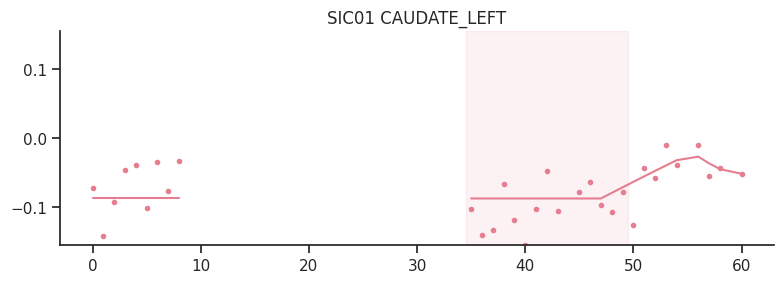

[2.00500000e+01 2.70500000e+01 9.99999910e-01 8.36458493e-03
 2.69292883e-01]


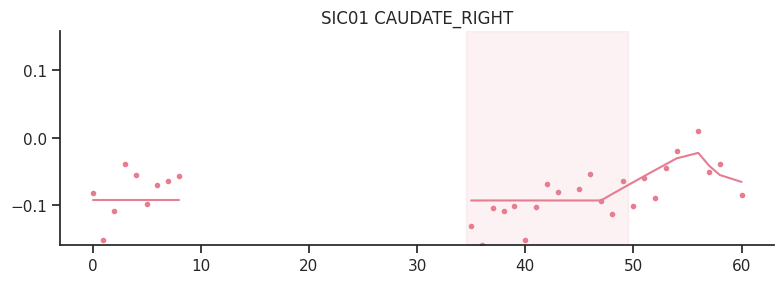

[12.05       24.05       -0.03602742  0.89969158  0.79999748]


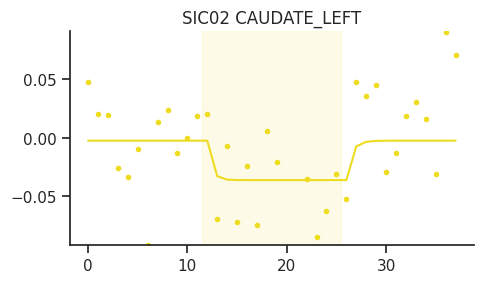

[12.05       24.05       -0.02843527  0.9         0.8       ]


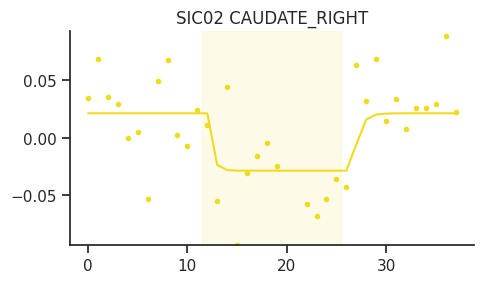

[1.40500000e+01 2.70500000e+01 7.18650847e-01 5.00000115e-03
 7.49864683e-03]


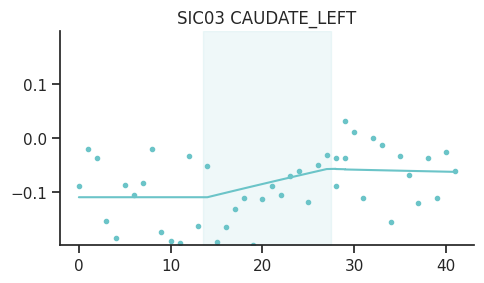

[1.40500000e+01 2.70500000e+01 9.99999012e-01 6.87547997e-03
 2.51336632e-02]


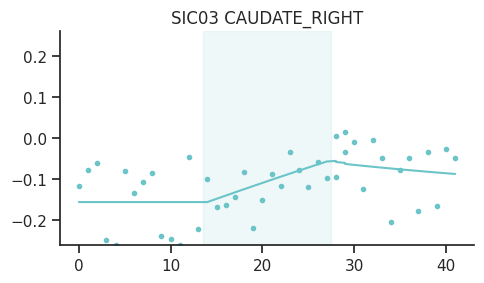

In [780]:
#post-cast to see the caudate effect
subpal={'SIC01':(230/255.,125/255.,144/255.),'SIC02':(238/255.,220/255.,33/255.),'SIC03':(107/255.,196/255.,200/255.)}
for e,s in enumerate(sub):
    xprov=[]
    yprov=[]
    for n2,n in enumerate(structurenamepost):
        try:
            

            sns.set_style('ticks')

            
            if e==0:
                fig= plt.figure(figsize=(8,3))
            else:
                fig=plt.figure(figsize=(5,3))
            ax = plt.gca()
            #bar of casting
            lim=np.max([np.abs(np.min(np.array(valpost[e][n2]))),np.max(np.array(valpost[e][n2]))])
            plt.fill_between([caststampsinit[e]-0.5,caststampsend[e]+0.5],-lim,lim,color=subpal[s], alpha=0.1)#np.min(np.array(val[e][n2])),np.max(np.array(val[e][n2]))
            #point
            plt.title(s+' '+n.replace('CIFTI_STRUCTURE_',''))
            plt.plot(time[e],valpost[e][n2],'.',color=subpal[s])

            #mean plot
            plt.plot(xprov,yprov,color=subpal[s])
            
            
            if e==0:
                shiftA=35-8
                shiftB=35-8
            elif e==1:
                shiftA=0
                shiftB=1
            else:
                shiftA=0
                shiftB=0
            dataprov=np.array(valpost[e][n2])[np.argsort(time[e])]

            if e==0:
                
                alphaparam=scipy.optimize.curve_fit(fit_plasticity_model_2alpha,dataprov,np.zeros(len(dataprov)),bounds=([caststampsinit[e]-shiftA,caststampsend[e]-shiftB,-1,0.005,0.005],[len(dataprov)+0.1,len(dataprov)+0.1,1,0.9,0.8]))
                print(alphaparam[0])
                fitval=plasticity_model_2alpha(dataprov, alphaparam[0][0],alphaparam[0][1], alphaparam[0][2], alphaparam[0][3],alphaparam[0][4])

            else:
                alphaparam=scipy.optimize.curve_fit(fit_plasticity_model_2alpha,dataprov,np.zeros(len(dataprov)),bounds=([caststampsinit[e]-shiftA,caststampsend[e]-shiftB,-1,0.005,0.005],[caststampsinit[e]-shiftA+0.1,caststampsend[e]-shiftB+0.1,1,0.9,0.8]))
                print(alphaparam[0])
                fitval=plasticity_model_2alpha(dataprov, caststampsinit[e]-shiftA,caststampsend[e]-shiftB, alphaparam[0][2], alphaparam[0][3],alphaparam[0][4])

            if e==0:
                plt.plot(time[e][np.argsort(time[e])][:9],fitval[:9],color=subpal[s])
                plt.plot(time[e][np.argsort(time[e])][9:],fitval[9:],color=subpal[s])
            else:
                plt.plot(time[e][np.argsort(time[e])],fitval,color=subpal[s])


            
            sns.despine()

            plt.ylim([-lim,lim])
            plt.savefig('path/figures/plasticitypulses/scatter_'+s+'_'+n+'_post-cast_FCavg.pdf')
            plt.show()
            
        except:
            print(n, 'fail')

/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/cm.py:40: RuntimeWarning: invalid value encountered in divide
  mix[:, color_index] = (


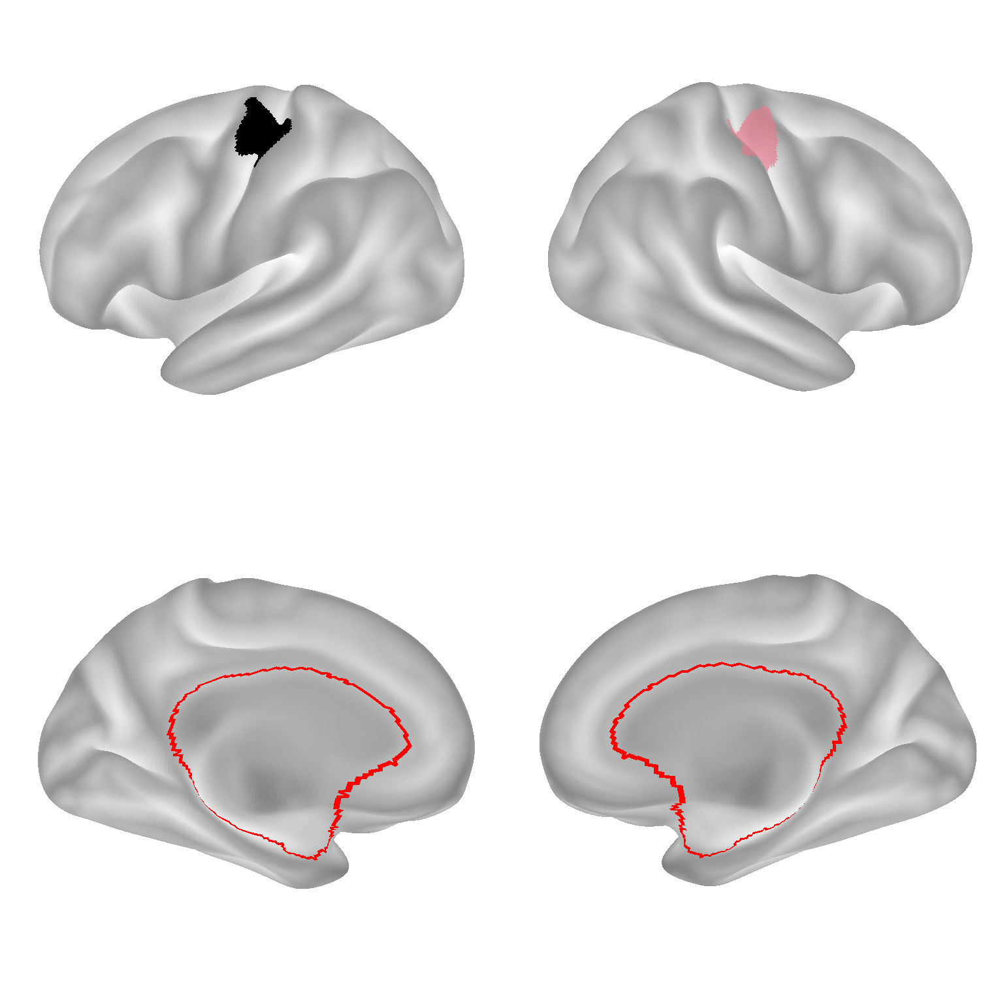

/tmp/ipykernel_198531/2456565635.py:107: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/tmp/ipykernel_198531/2456565635.py:107: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


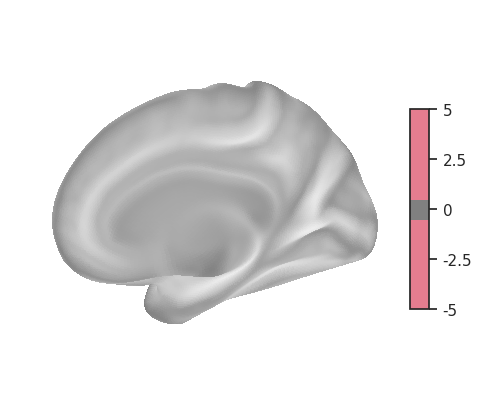

/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:433: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(


raw 0 ready
raw 1 ready
raw 2 ready


/tmp/ipykernel_198531/297237949.py:215: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


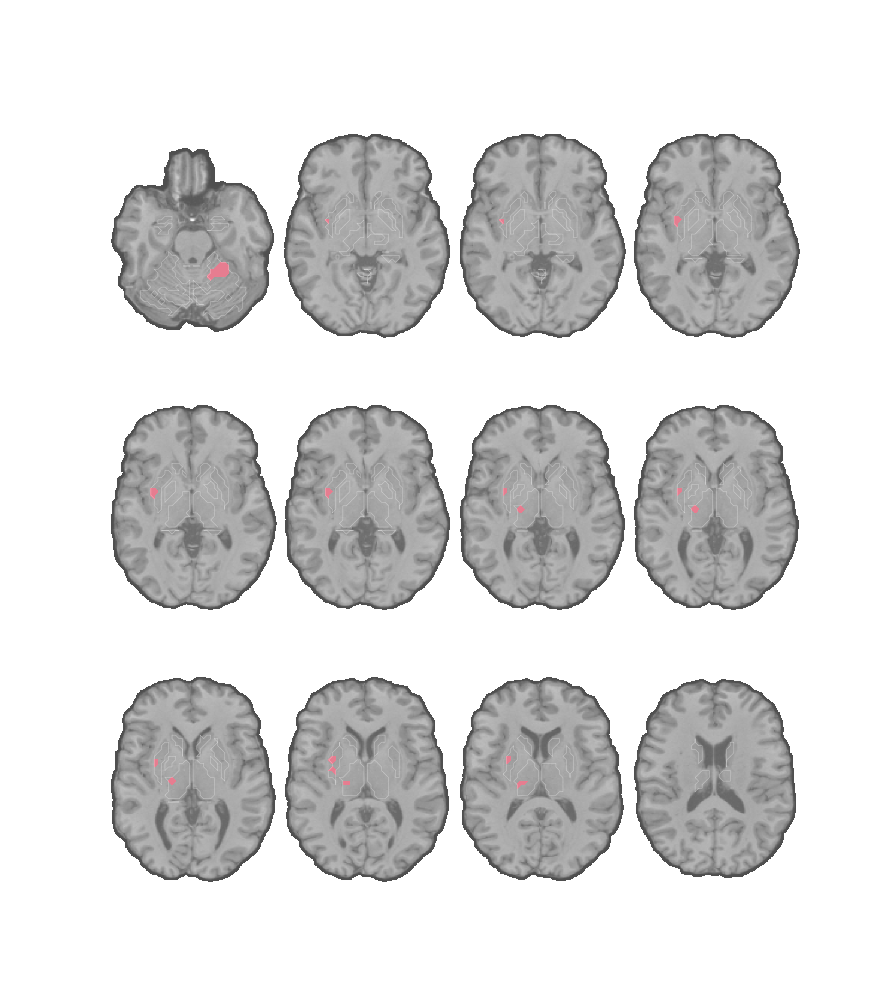

/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/cm.py:40: RuntimeWarning: invalid value encountered in divide
  mix[:, color_index] = (


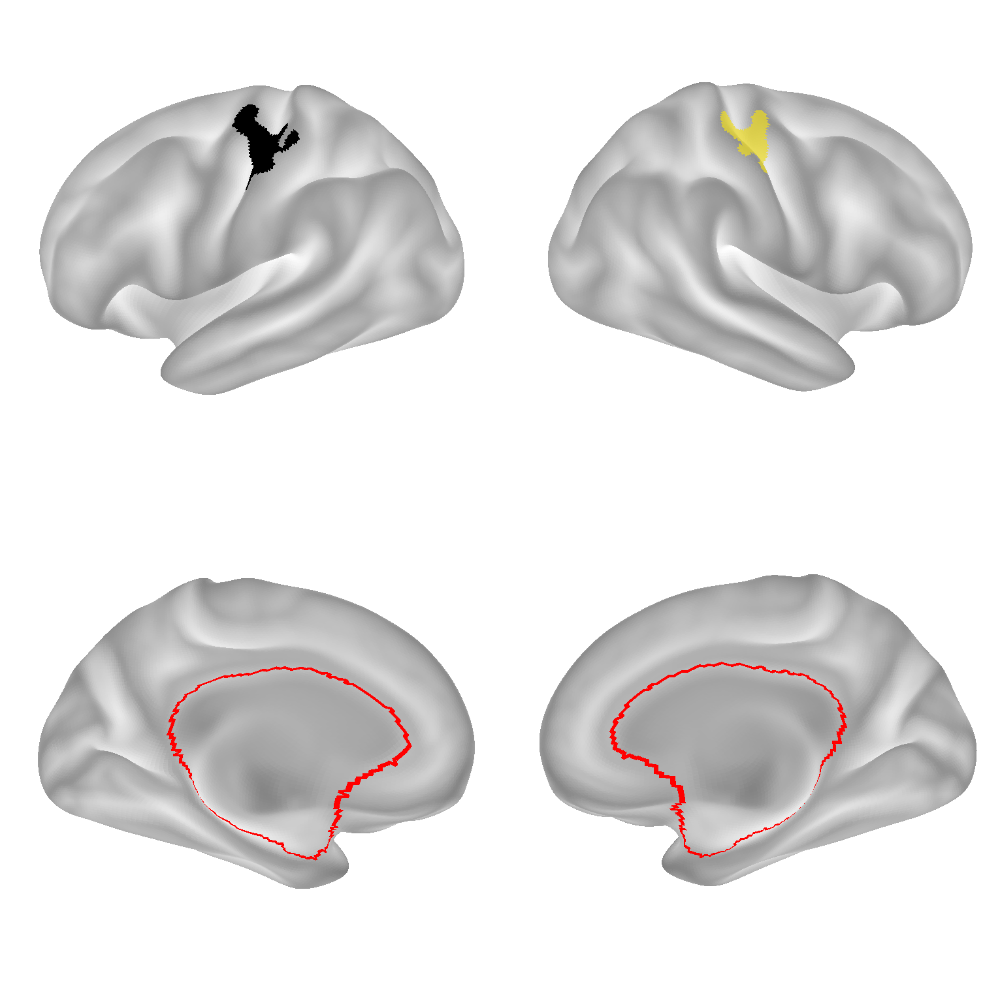

/tmp/ipykernel_198531/2456565635.py:107: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/tmp/ipykernel_198531/2456565635.py:107: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


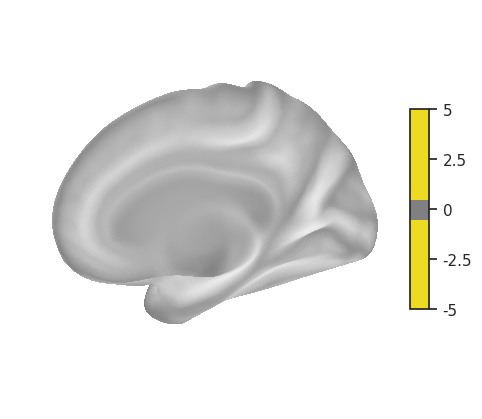

/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:433: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(


raw 0 ready
raw 1 ready
raw 2 ready


/tmp/ipykernel_198531/297237949.py:215: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


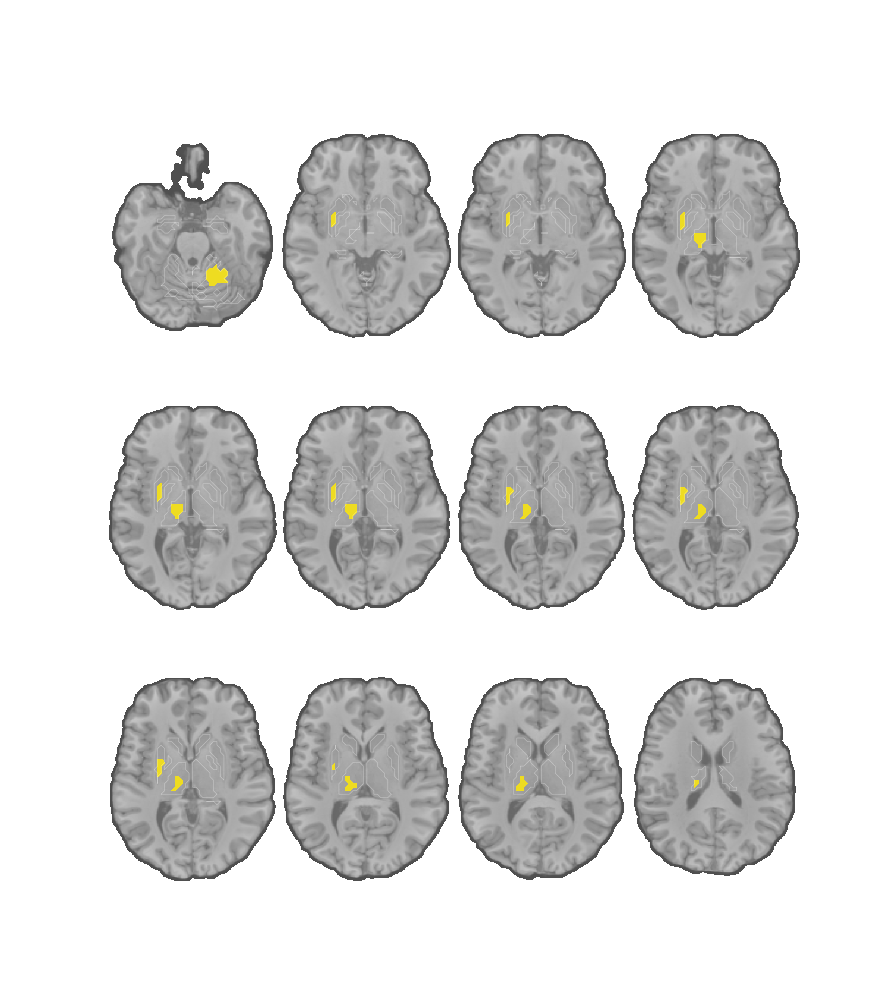

/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/cm.py:40: RuntimeWarning: invalid value encountered in divide
  mix[:, color_index] = (


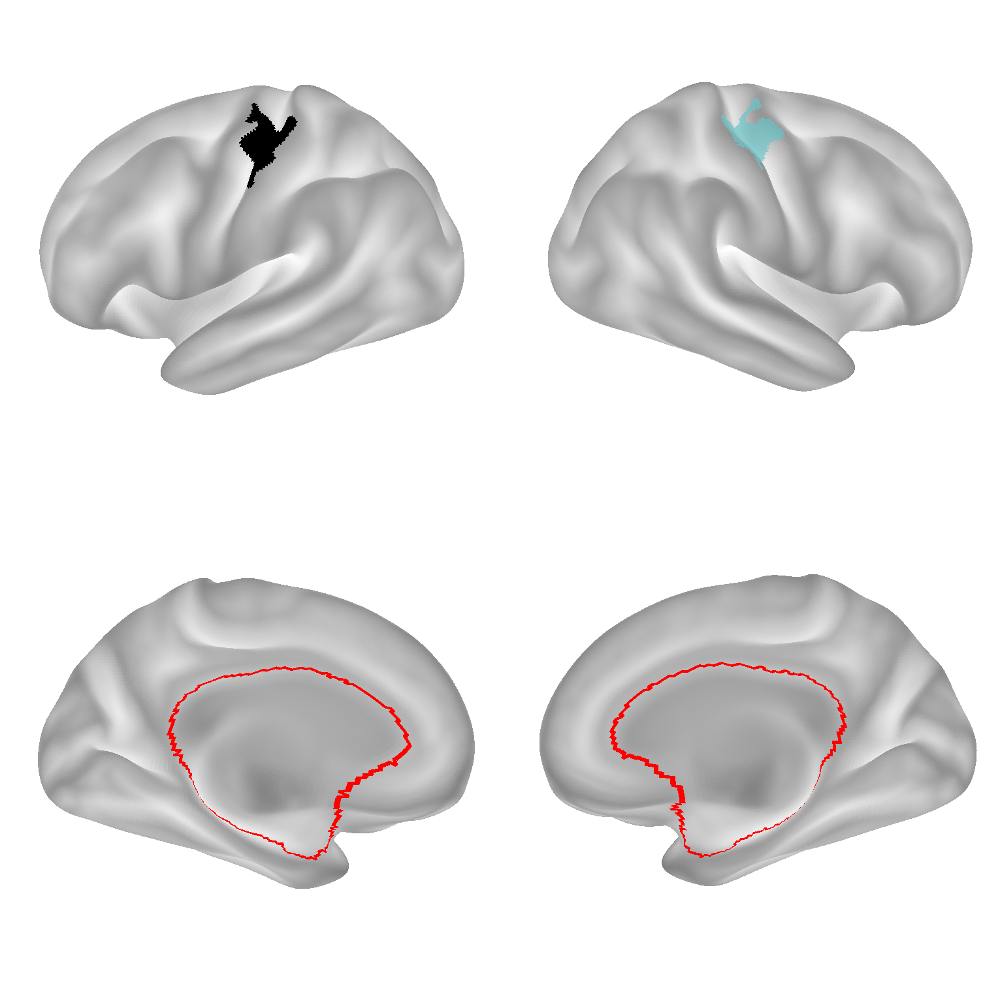

/tmp/ipykernel_198531/2456565635.py:107: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/tmp/ipykernel_198531/2456565635.py:107: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


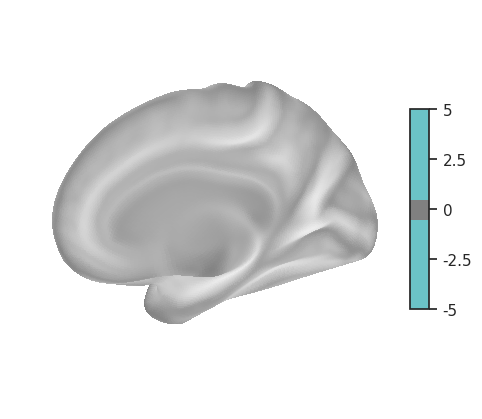

/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:433: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(


raw 0 ready
raw 1 ready


/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1454: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1455: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


raw 2 ready


/tmp/ipykernel_198531/297237949.py:215: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


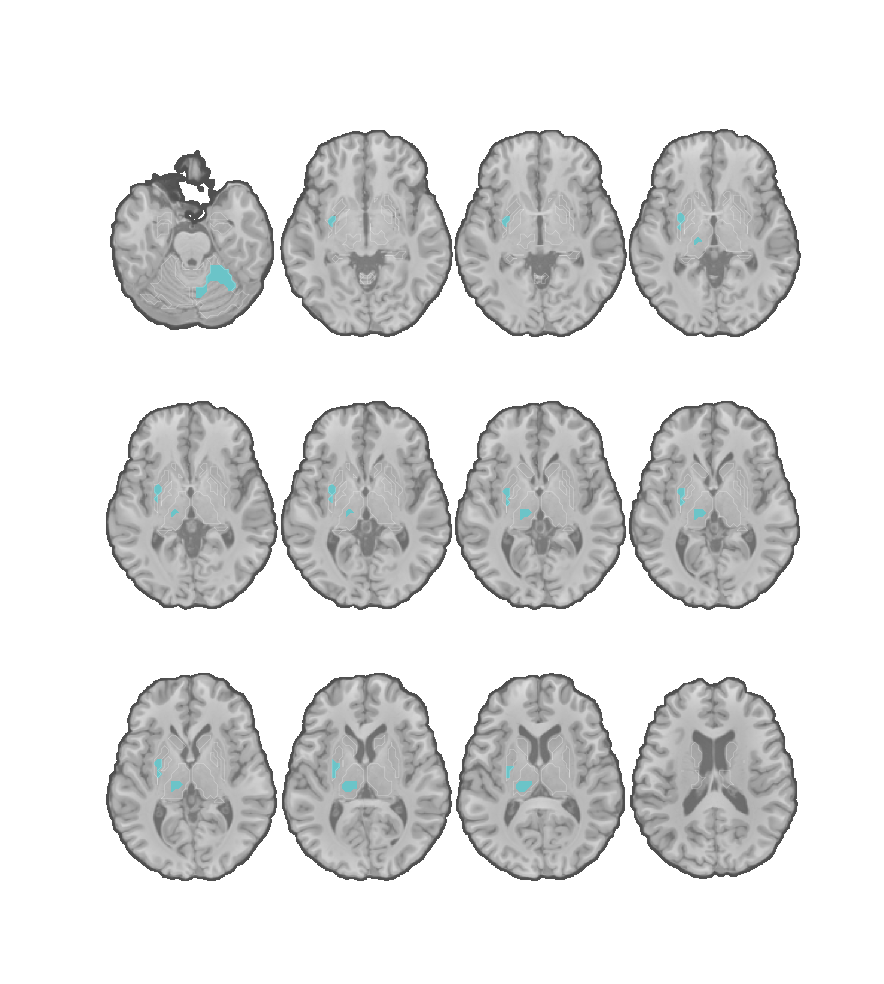

In [639]:
#seed regions for the figure
T1path=['path/Structurals/cast/bet/'+s+'/T1_masked.nii.gz' for s in sub]
sideval=[1,-1]
limselect=[1.7,3.4,3.4]
for e,s in enumerate(sub):
    for comp in ['cast-pre']:#,'post-cast']:
        side='L'

        pathtest='path/RestProcessing/cast/smooth255/'+s+'/FC/'
        pathorig=pathtest+comp+'_'+side+'sm1avg_dconn_cohensd_maskdynamic.dtseries.nii'

        colorpic=[subpal[s] for i in range(3)]
        
        my_cmap = get_continuous_cmap(sns.color_palette(colorpic).as_hex())
        
        img_contour=ciftilocnet[e]
        contval=[9]#9,18]#11,17,6,
        contcolor=[np.concatenate([i,[0.5]],0) for i in np.array(netspotcolorMOD)[[9]]]#10,16,5,

        handroi='path/'+s+'/handseed.dtseries.nii'
        img_contour=ciftilocnet[e]
        contval=[0]#11,17,6,
        contcolor=[np.concatenate([i,[0.5]],0) for i in np.array(netspotcolorMOD)[[0]]]#10,16,5,

        plotsurfwithcontNroiProgressTER(pathorig,img_contour,handroi,contval,contcolor,roipos=['LL'],roival=1,vmin=-5,vmax=5,threshold=0.5,palette=my_cmap,savefig='path/figures/plasticitypulses/surf_'+s+'_'+comp+'_maskdyamic.pdf',rollZ=20,scale=0.7,avg='median')

        
        
        color_listpos = [subpal[s] for i in range(3)]
        lim=[1,3]#limmaxall[e]]
        limpos=np.arange(1,4)-0.1

        plt.figure(figsize=[9,10])
        plotvolindivT1(pathorig,T1path[e],ortho='z',cut_coords=[-21,-4,-2,-1,0,1,2,3,4,6,8,16],Nraw=3,colorpos=color_listpos,savefig='path/figures/plasticitypulses/vol_'+s+'_'+comp+'_maskdyamic.pdf',thresholdpos=limpos,Zannotate=False,smoothing=None)
        plt.show()
            
            

# SNR maps


In [787]:
#select files before confound cleaning

locBP=['path/SIC01/vcXXX/boldrest_1/vcXXX_b*_faln_dbnd_xr3d_uwrp_atl_tr.dtseries.nii',
       'path/SIC02/vcXXX/boldrest_1/vcXXX_b*_faln_dbnd_xr3d_uwrp_atl_tr.dtseries.nii',
      'path/SIC03/vcXXX/boldrest_1/vcXXX_b*_faln_dbnd_xr3d_uwrp_atl_tr.dtseries.nii']


for e,s in enumerate(sub):
    snrmaps=[]
    
    
    for e2,p2 in enumerate(pplist[e]):
        
        p5=np.unique([p3.split('_')[0] for p3 in p2])
        for e4,p4 in enumerate(p5):
            vc=p4
            file=glob.glob(locBP[e].replace('vcXXX',p4))[0]
            test=np.abs(nibabel.load(file).get_fdata())
            snrmaps+=[np.nanmean(test,0)/np.nanstd(test,0)]
    snrmaps=np.nanmean(snrmaps,0)
    raw=nibabel.load(file)
    axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
    # You'll want the brain model axis
    time_axis, brain_model_axis = axes
    time_axis2=nibabel.cifti2.cifti2_axes.SeriesAxis(1,1,1)
    img=ci.Cifti2Image(np.array([snrmaps/1000*100]), header=(time_axis2, brain_model_axis),
            nifti_header=raw.nifti_header) #file are mod 1000
    ci.save(img,'path/RestProcessing/cast/smooth255/'+s+'/SNRavgmap.dtseries.nii')

                              

/tmp/ipykernel_198531/978409145.py:28: RuntimeWarning: divide by zero encountered in divide
  snrmaps+=[np.nanmean(test,0)/np.nanstd(test,0)]
/tmp/ipykernel_198531/978409145.py:28: RuntimeWarning: invalid value encountered in divide
  snrmaps+=[np.nanmean(test,0)/np.nanstd(test,0)]
/tmp/ipykernel_198531/978409145.py:29: RuntimeWarning: Mean of empty slice
  snrmaps=np.nanmean(snrmaps,0)


In [1241]:
#calculate theaverage and percent drop
T1path=['path/Structurals/cast/bet/'+s+'/T1_masked.nii.gz' for s in sub]
sideval=[1,-1]

for e,s in enumerate(sub):#just changing the scaling of the thalamus

    
    pathorig='path/RestProcessing/cast/smooth255/'+s+'/SNRavgmap.dtseries.nii'
    
    raw=nibabel.load(pathorig)
    origdata=copy.deepcopy(np.array(raw.dataobj[0]))
    
    origdata=(origdata-np.nanmax(origdata[np.where(~np.isinf(origdata))]))
    
    axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
    # You'll want the brain model axis
    time_axis, brain_model_axis = axes
    time_axis2=nibabel.cifti2.cifti2_axes.SeriesAxis(1,1,1)
    img=ci.Cifti2Image(np.array([origdata]), header=(time_axis2, brain_model_axis),
            nifti_header=raw.nifti_header)
    ci.save(img,'path/RestProcessing/cast/smooth255/'+s+'/SNRavgmap_percentdropfrommax.dtseries.nii')

    
            

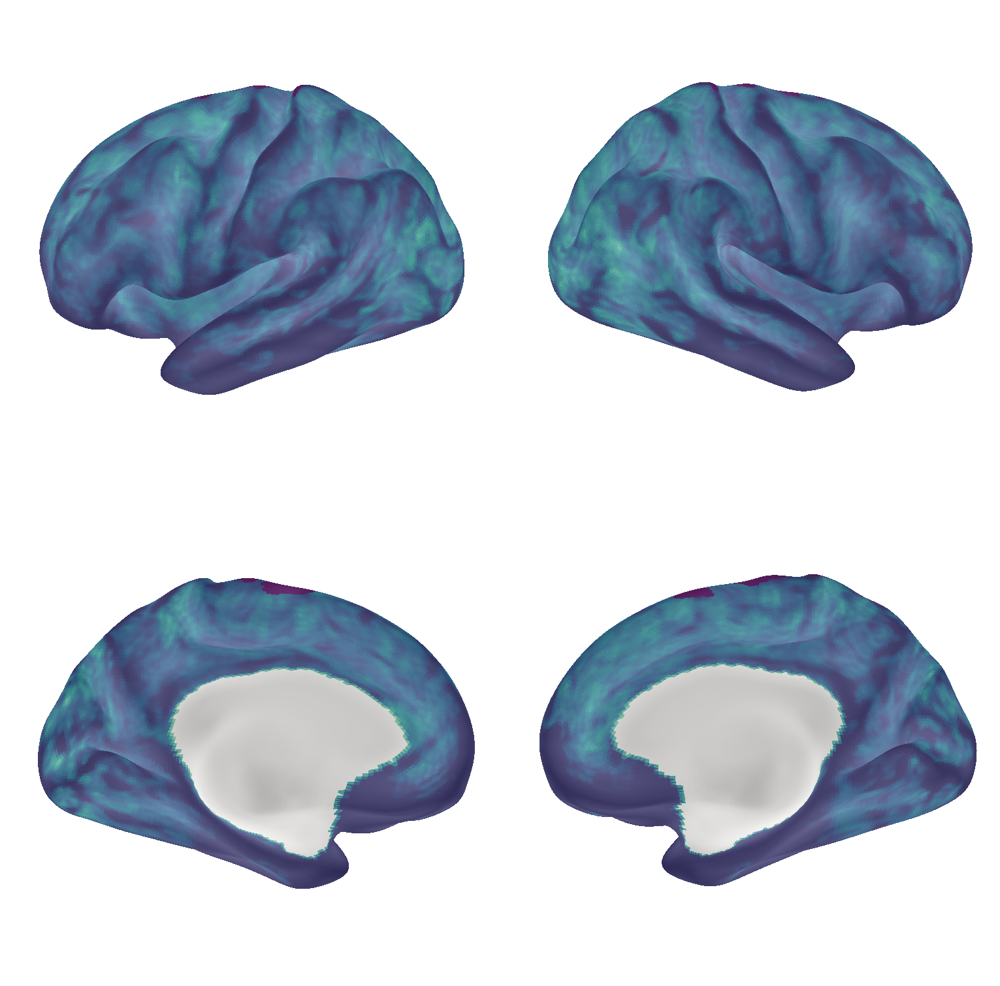

/tmp/ipykernel_54756/4123663514.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/tmp/ipykernel_54756/4123663514.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


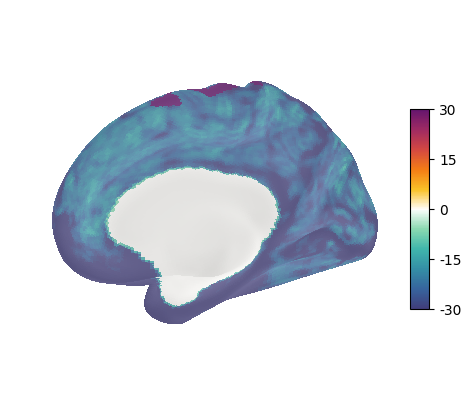

/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,


raw 0 ready


/tmp/ipykernel_54756/297237949.py:215: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


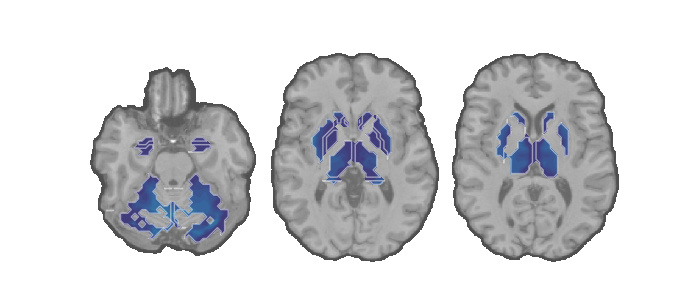

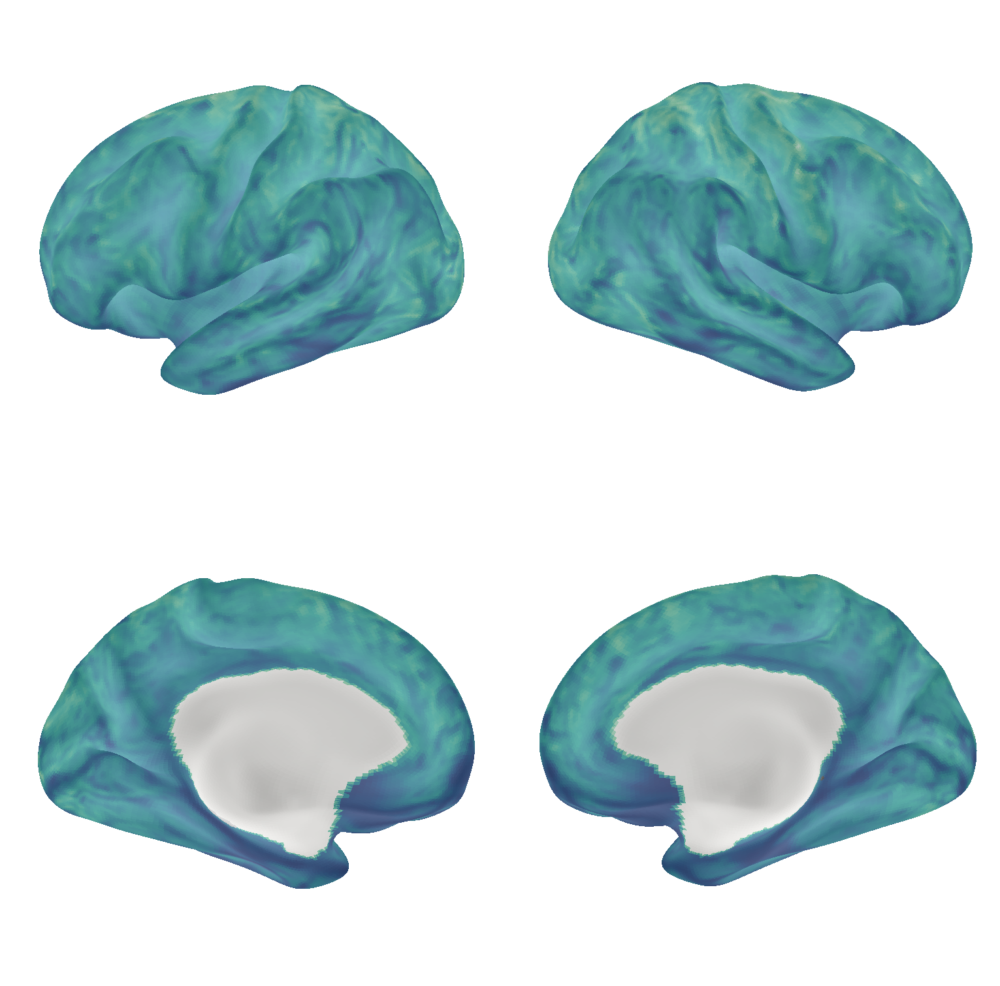

/tmp/ipykernel_54756/4123663514.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/tmp/ipykernel_54756/4123663514.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


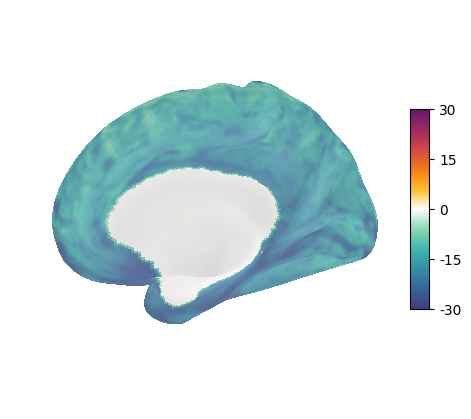

/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,


raw 0 ready


/tmp/ipykernel_54756/297237949.py:215: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


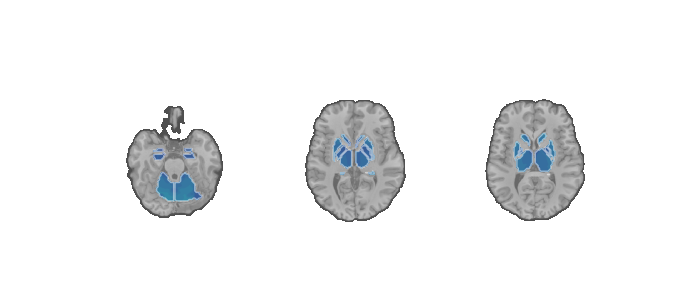

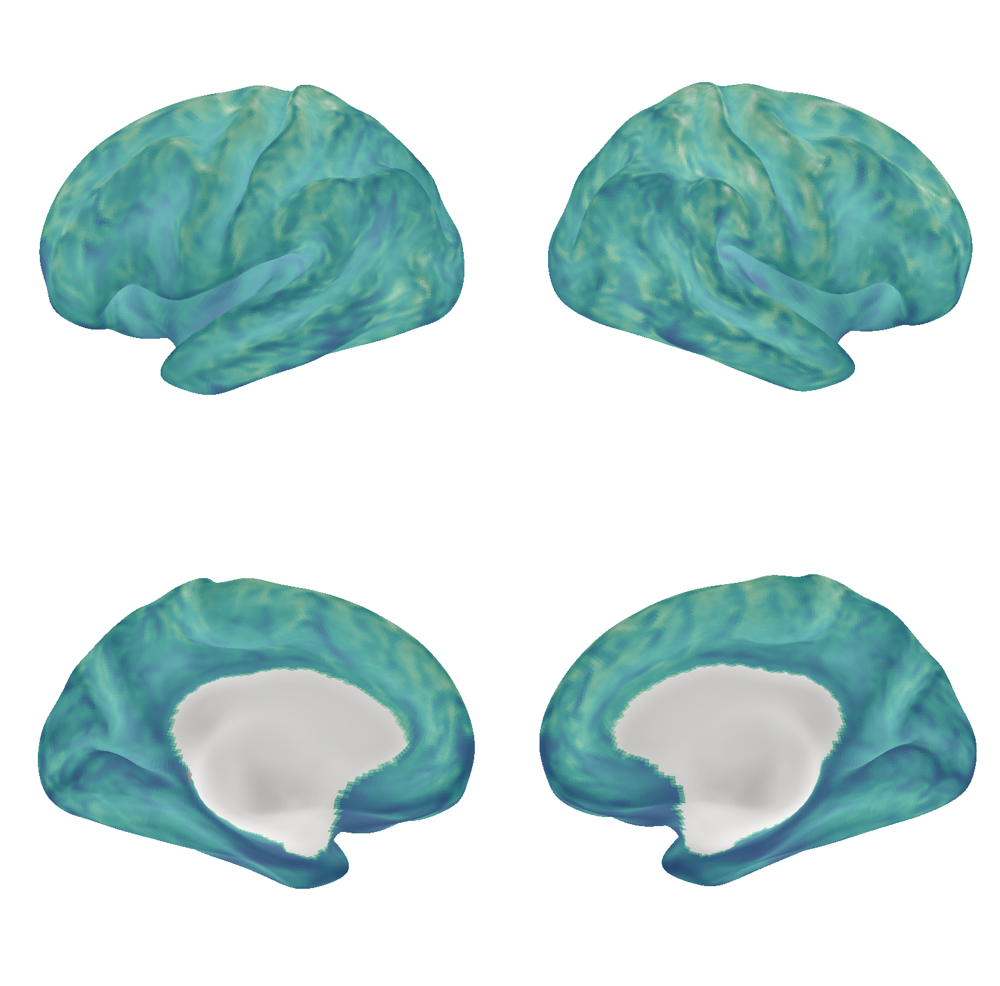

/tmp/ipykernel_54756/4123663514.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/tmp/ipykernel_54756/4123663514.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


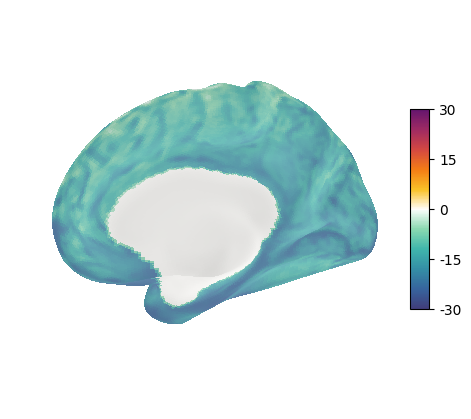

/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:433: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(


raw 0 ready


/tmp/ipykernel_54756/297237949.py:215: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


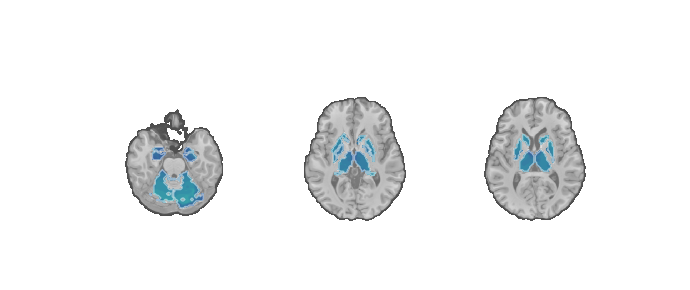

In [30]:
T1path=['path/Structurals/cast/bet/'+s+'/T1_masked.nii.gz' for s in sub]
sideval=[1,-1]

for e,s in enumerate(sub):#just changing the scaling of the thalamus

    
    pathorig='path/RestProcessing/cast/smooth255/'+s+'/SNRavgmap.dtseries.nii'
    
    raw=nibabel.load(pathorig)
    origdata=copy.deepcopy(np.array(raw.dataobj[0]))
    
    origdata=(origdata-np.nanmean(origdata[np.where(~np.isinf(origdata))]))/np.nanstd((origdata[np.where(~np.isinf(origdata))]))*100
    
    axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
    # You'll want the brain model axis
    time_axis, brain_model_axis = axes
    time_axis2=nibabel.cifti2.cifti2_axes.SeriesAxis(1,1,1)
    img=ci.Cifti2Image(np.array([origdata]), header=(time_axis2, brain_model_axis),
            nifti_header=raw.nifti_header)
    ci.save(img,'path/RestProcessing/cast/smooth255/'+s+'/SNRavgmap_percentdrop.dtseries.nii')

    pathorig='path/RestProcessing/cast/smooth255/'+s+'/SNRavgmap_percentdropfrommax.dtseries.nii'
    
    raw=nibabel.load(pathorig)
    origdata=copy.deepcopy(np.array(raw.dataobj[0]))
    lim=30
    

    img_contour=ciftilocnet[e]
    contval=[]
    contcolor=[]

    thresh=0
    mycmap=mycolorscale("matket",limpos=lim,limneg=-lim,threshold=thresh)
    plotsurfwithcontBIS(pathorig,img_contour,contval,contcolor,vmin=-lim,vmax=lim,palette=mycmap,savefig='path/figures/plasticitypulses/surf_snrmap_'+s+'_percentfrommax.pdf',rollZ=20,scale=0.7)
    
    mycmap=mycolorscale("matket",limpos=lim,limneg=-lim,threshold=thresh,Ncolor=50)

    color_listpos = [(mycmap(i)) for i in range(25,50)]#[::-1]
    color_listneg = [(mycmap(i)) for i in np.arange(24,-1,-1)]#[::-1]
    lim=[0,lim]
    limpos=np.concatenate([[lim[0]],[(lim[1]-lim[0])*(i+1)/24+lim[0] for i in range(24)]],0)
    
    limneg=limpos

    plt.figure(figsize=[7,3])
    plotvolindivT1(pathorig,T1path[e],ortho='z',cut_coords=[-21,1,6],Nraw=1,colorpos=color_listpos,colorneg=color_listneg,savefig='path/figures/plasticitypulses/vol_snrmap_'+s+'_percentfrommax.pdf',thresholdneg=limneg,thresholdpos=limpos,Zannotate=False,smoothing=None)
    plt.show()
            
            
            

# Simple HRF

In [ ]:
#results from the FSl feat, 
T1path=['path/Structurals/cast/bet/'+s+'/T1_masked.nii.gz' for s in sub]
sideval=[1,-1]

for e,s in enumerate(sub):#just changing the scaling of the thalamus

    
    pathorig='path/'+s+'/second_level_cifti_during_pulse-6-HRF_LR_fix_nolearning/cifti_cope1/tstat1_smooth6.0.dtseries.nii'
    
    raw=nibabel.load(pathorig)
    origdata=copy.deepcopy(np.array(raw.dataobj[0]))
    lim=np.percentile(origdata[np.where(~np.isnan(origdata))],95)
    

    img_contour=ciftilocnet[e]
    contval=[9,18]#11,17,6,
    contcolor=[np.concatenate([i,[0.5]],0) for i in np.array(netspotcolorMOD)[[8,17]]]#10,16,5,

    thresh=np.percentile(origdata[np.where(~np.isnan(origdata))],50)
    
    mycmap=mycolorscale("salsea",limpos=lim,limneg=-lim,threshold=thresh,Ncolor=50)

    color_listpos = [(mycmap(i)) for i in range(25,50)]#[::-1]
    color_listneg = [(mycmap(i)) for i in np.arange(24,-1,-1)]#[::-1]
    lim=[0,lim]
    limpos=np.concatenate([[lim[0]],[(lim[1]-lim[0])*(i+1)/24+lim[0] for i in range(24)]],0)
    origdata[np.where(np.abs(origdata)<=thresh)]=0
    img=ci.Cifti2Image(np.array([origdata]), header=raw.header)
    ci.save(img,os.path.dirname(pathorig)+'/temp.dtseries.nii')
    limneg=limpos
    
    
    plt.figure(figsize=[9,10])
    plotvolindivT1(os.path.dirname(pathorig)+'/temp.dtseries.nii',T1path[e],ortho='z',cut_coords=[-21,-4,-2,-1,0,1,2,3,4,6,8,16],Nraw=3,colorpos=color_listpos,colorneg=color_listneg,savefig='path/figures/plasticitypulses/vol_normaldoublegammafsl_lsm1pulse_'+s+'.pdf',thresholdneg=limneg,thresholdpos=limpos,Zannotate=False,smoothing=None)
    plt.show()
            
            
            

[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]


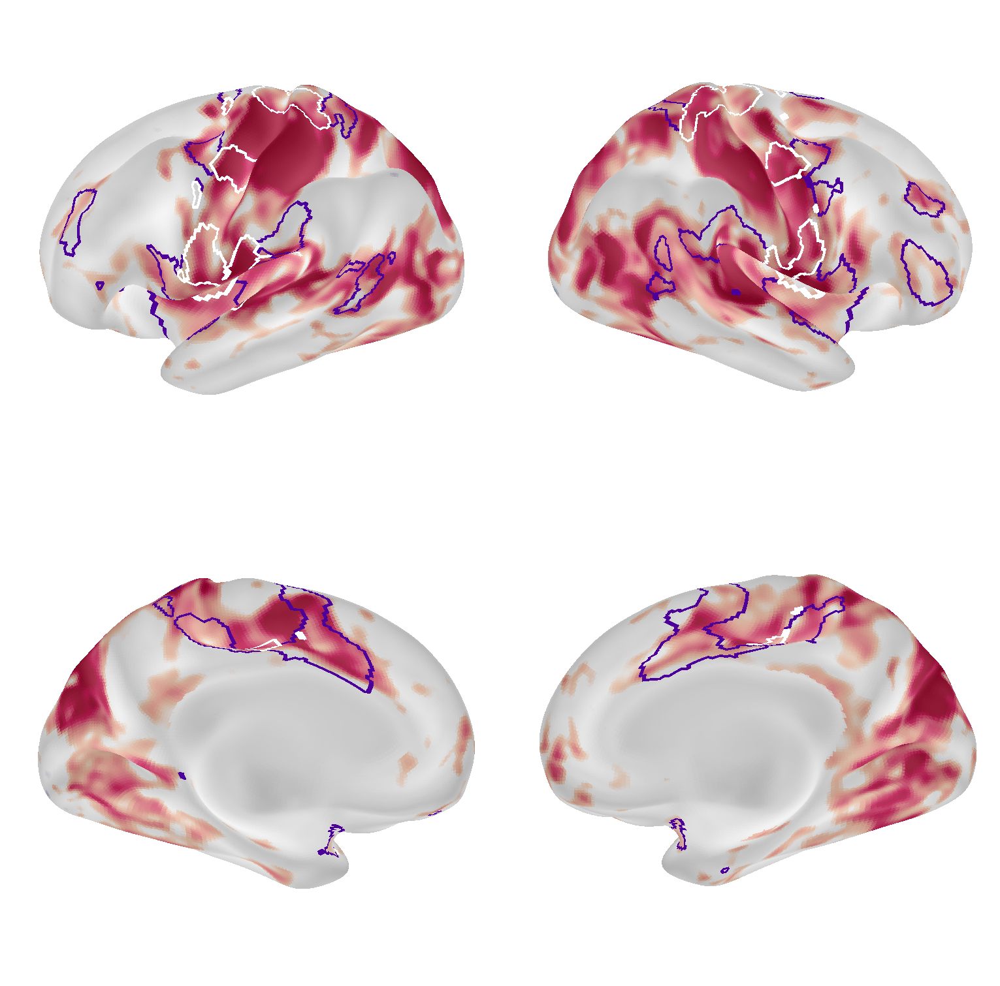

/tmp/ipykernel_198531/1287250854.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/tmp/ipykernel_198531/1287250854.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


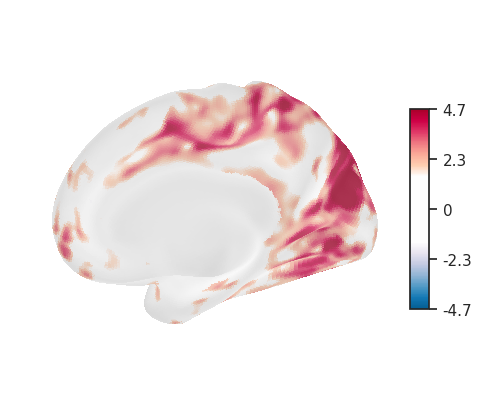

[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]


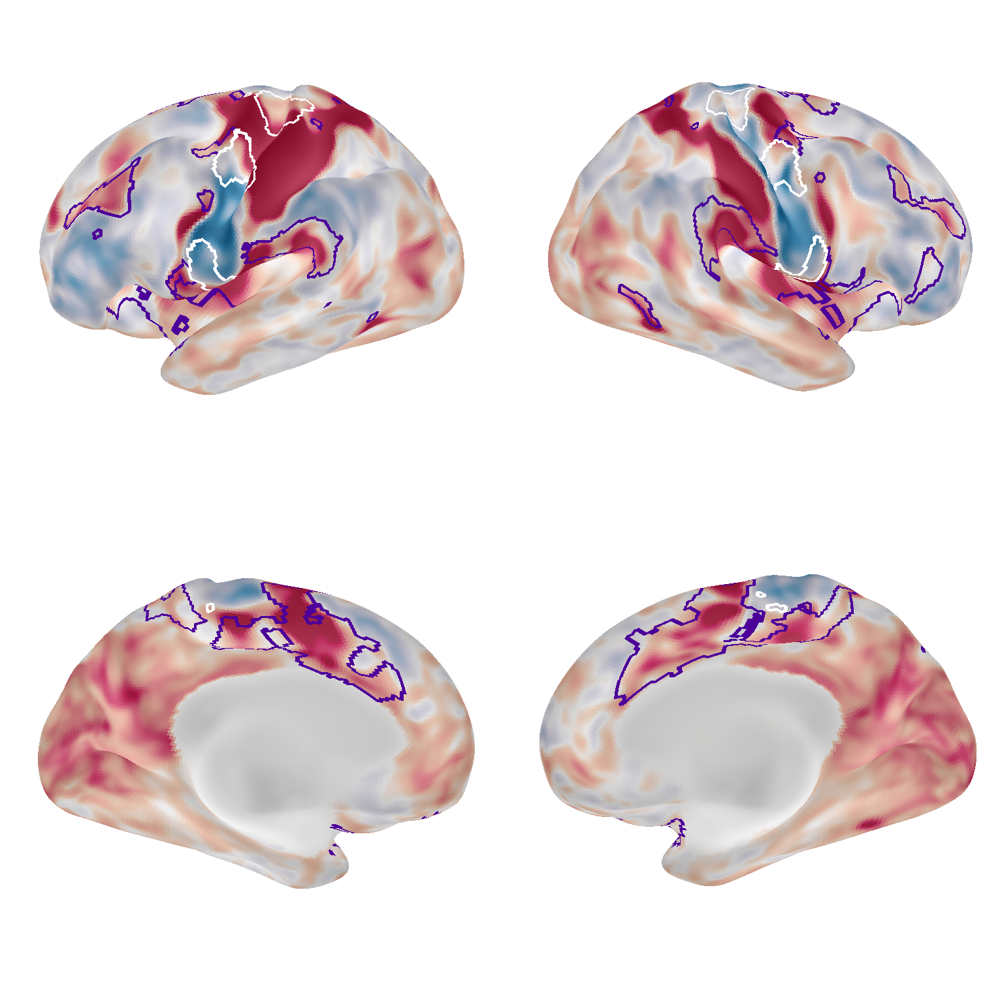

/tmp/ipykernel_198531/1287250854.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/tmp/ipykernel_198531/1287250854.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


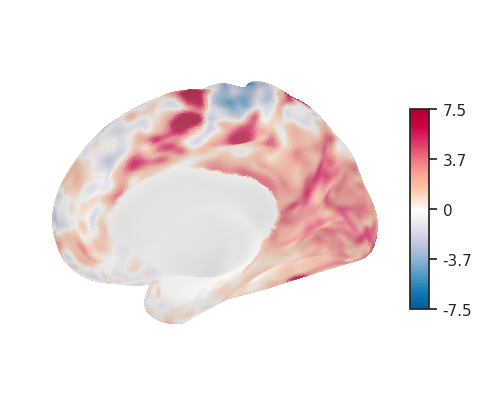

[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]


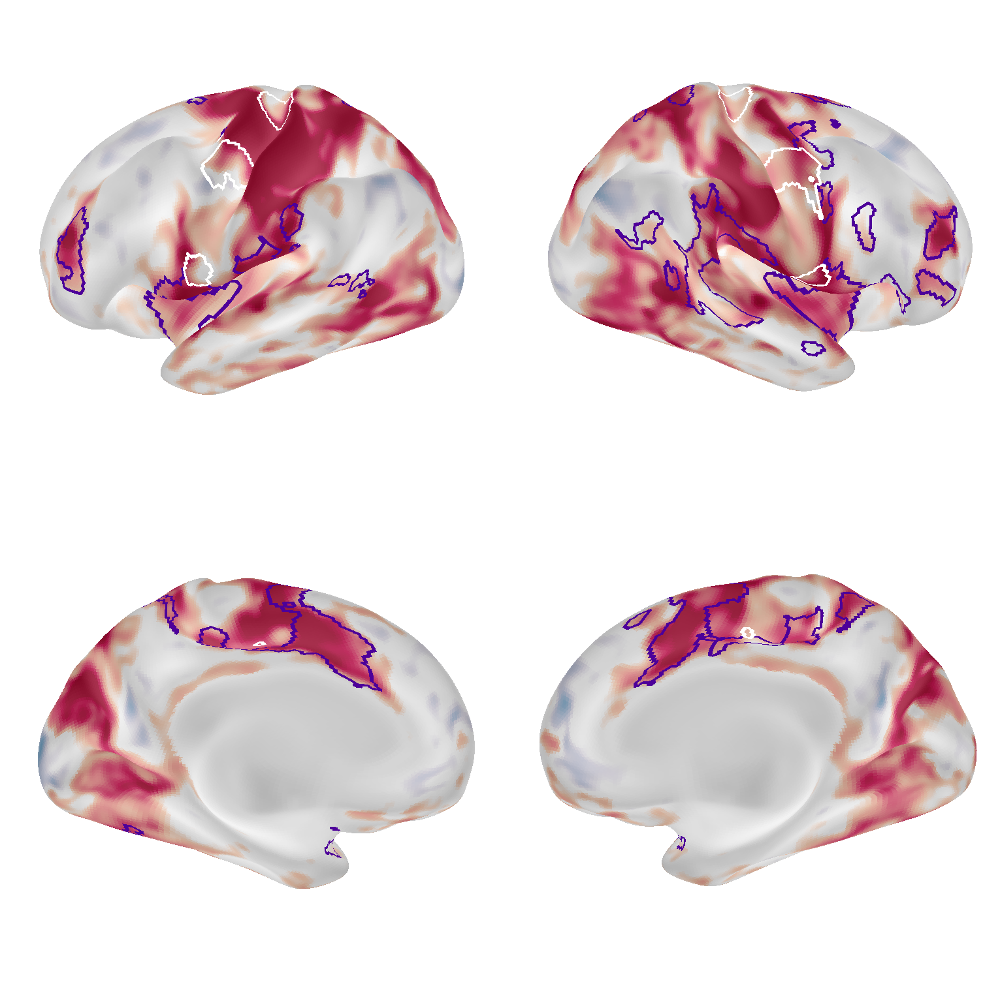

/tmp/ipykernel_198531/1287250854.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/tmp/ipykernel_198531/1287250854.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


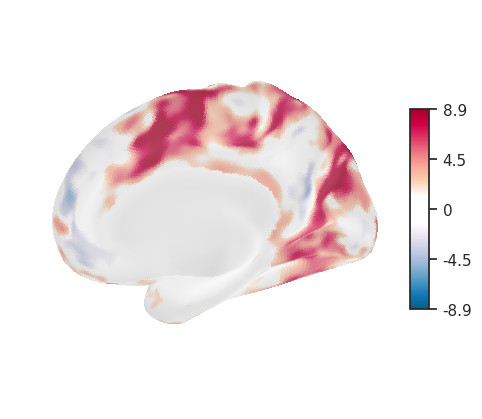

In [1239]:
T1path=['path/Structurals/cast/bet/'+s+'/T1_masked.nii.gz' for s in sub]
sideval=[1,-1]

for e,s in enumerate(sub):#just changing the scaling of the thalamus

    
    pathorig='path/'+s+'/second_level_cifti_during_pulse-6-HRF_LR_fix_nolearning/cifti_cope1/tstat1_smooth6.0.dtseries.nii'
    
    raw=nibabel.load(pathorig)
    origdata=copy.deepcopy(np.array(raw.dataobj[0]))
    lim=np.percentile(origdata[np.where(~np.isnan(origdata))],95)
    

    img_contour=ciftilocnet[e]
    contval=[9,18]#11,17,6,
    contcolor=[np.concatenate([i,[0.5]],0) for i in np.array(netspotcolorMOD)[[8,17]]]#10,16,5,
    contcolor[1]=white
    thresh=np.percentile(origdata[np.where(~np.isnan(origdata))],50)
    mycmap=mycolorscale("salsea",limpos=lim,limneg=-lim,threshold=thresh)
    plotsurfwithcontBIS(pathorig,img_contour,contval,contcolor,vmin=-lim,vmax=lim,palette=mycmap,savefig='path/figures/plasticitypulses/surf_normaldoublegammafsl_lsm1pulse_'+s+'.pdf',rollZ=20,scale=0.7)
    
    
            
            
            